In [28]:
import numpy as np
import pandas as pd

In [29]:
df = pd.read_csv('training.csv')

In [30]:
df.head()

,EventId,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,...,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label
0,100000,138.470,51.655,97.827,27.980,0.91,124.711,2.666,3.064,41.928,...,2,67.435,2.150,0.444,46.062,1.24,-2.475,113.497,0.002653,s
1,100001,160.937,68.768,103.235,48.146,-999.00,-999.000,-999.000,3.473,2.078,...,1,46.226,0.725,1.158,-999.000,-999.00,-999.000,46.226,2.233584,b
2,100002,-999.000,162.172,125.953,35.635,-999.00,-999.000,-999.000,3.148,9.336,...,1,44.251,2.053,-2.028,-999.000,-999.00,-999.000,44.251,2.347389,b
3,100003,143.905,81.417,80.943,0.414,-999.00,-999.000,-999.000,3.310,0.414,...,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,-0.000,5.446378,b
4,100004,175.864,16.915,134.805,16.405,-999.00,-999.000,-999.000,3.891,16.405,...,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,0.000,6.245333,b


In [31]:
df.iloc[:, 1]

0         138.470
1         160.937
2        -999.000
3         143.905
4         175.864
5          89.744
6         148.754
7         154.916
8         105.594
9         128.053
10       -999.000
11        114.744
12        145.297
13         82.488
14       -999.000
15        111.026
16        114.256
17        127.861
18       -999.000
19       -999.000
20       -999.000
21         90.736
22         87.075
23        141.481
24        110.785
25         76.883
26        137.197
27        111.271
28        118.104
29         98.761
           ...   
249970    158.674
249971   -999.000
249972    102.569
249973    103.483
249974    128.898
249975    140.352
249976    137.371
249977     96.952
249978     86.190
249979     92.645
249980    119.934
249981     87.390
249982    146.903
249983     80.388
249984    112.308
249985    126.151
249986    164.310
249987    140.080
249988     89.509
249989   -999.000
249990    127.822
249991    133.457
249992   -999.000
249993    130.075
249994    

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250000 entries, 0 to 249999
Data columns (total 33 columns):
EventId                        250000 non-null int64
DER_mass_MMC                   250000 non-null float64
DER_mass_transverse_met_lep    250000 non-null float64
DER_mass_vis                   250000 non-null float64
DER_pt_h                       250000 non-null float64
DER_deltaeta_jet_jet           250000 non-null float64
DER_mass_jet_jet               250000 non-null float64
DER_prodeta_jet_jet            250000 non-null float64
DER_deltar_tau_lep             250000 non-null float64
DER_pt_tot                     250000 non-null float64
DER_sum_pt                     250000 non-null float64
DER_pt_ratio_lep_tau           250000 non-null float64
DER_met_phi_centrality         250000 non-null float64
DER_lep_eta_centrality         250000 non-null float64
PRI_tau_pt                     250000 non-null float64
PRI_tau_eta                    250000 non-null float64
PRI_tau_phi

In [33]:
df['Label'].unique()

array(['s', 'b'], dtype=object)

In [34]:
x = df['Label'].str.replace('b', '0', regex=False)
x = x.str.replace('s', '1', regex=False)

In [35]:
df['Label'] = x

In [36]:
df['Label'] = df.apply(lambda x: int(x[-1]), axis=1)

In [37]:
df.drop('EventId', axis=1).describe()

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,...,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label
count,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,...,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000,250000.000000
mean,-49.023079,49.239819,81.181982,57.895962,-708.420675,-601.237051,-709.356603,2.373100,18.917332,158.432217,...,0.979176,-348.329567,-399.254314,-399.259788,-692.381204,-709.121609,-709.118631,73.064591,1.646767,0.342668
std,406.345647,35.344886,40.828691,63.655682,454.480565,657.972302,453.019877,0.782911,22.273494,115.706115,...,0.977426,532.962789,489.338286,489.333883,479.875496,453.384624,453.389017,98.015662,1.875103,0.474603
min,-999.000000,0.000000,6.329000,0.000000,-999.000000,-999.000000,-999.000000,0.208000,0.000000,46.104000,...,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,0.000000,0.001502,0.000000
25%,78.100750,19.241000,59.388750,14.068750,-999.000000,-999.000000,-999.000000,1.810000,2.841000,77.550000,...,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,0.000000,0.018636,0.000000
50%,105.012000,46.524000,73.752000,38.467500,-999.000000,-999.000000,-999.000000,2.491500,12.315500,120.664500,...,1.000000,38.960000,-1.872000,-2.093000,-999.000000,-999.000000,-999.000000,40.512500,1.156188,0.000000
75%,130.606250,73.598000,92.259000,79.169000,0.490000,83.446000,-4.593000,2.961000,27.591000,200.478250,...,2.000000,75.349000,0.433000,0.503000,33.703000,-2.457000,-2.275000,109.933750,2.404128,1.000000
max,1192.026000,690.075000,1349.351000,2834.999000,8.503000,4974.979000,16.690000,5.684000,2834.999000,1852.462000,...,3.000000,1120.573000,4.499000,3.141000,721.456000,4.500000,3.142000,1633.433000,7.822543,1.000000


In [38]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [39]:
df.drop(['EventId'], axis=1).corr()

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,...,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label
DER_mass_MMC,1.000000,-0.455755,0.168548,0.198765,0.162661,0.160524,0.162521,0.228105,0.045826,0.201464,...,0.221078,0.250158,0.247083,0.247078,0.162836,0.162614,0.162609,0.185372,-0.327244,0.239149
DER_mass_transverse_met_lep,-0.455755,1.000000,0.190109,-0.249116,-0.176386,-0.190392,-0.175942,0.043251,0.017758,-0.146837,...,-0.210537,-0.229674,-0.220370,-0.220355,-0.176837,-0.176231,-0.176225,-0.210009,0.419843,-0.351428
DER_mass_vis,0.168548,0.190109,1.000000,-0.062562,-0.032251,-0.040620,-0.032126,0.579712,-0.000702,0.088685,...,-0.026860,-0.019151,-0.013749,-0.013742,-0.033188,-0.032202,-0.032206,-0.052902,0.102172,-0.014055
DER_pt_h,0.198765,-0.249116,-0.062562,1.000000,0.523664,0.534531,0.523639,-0.539379,0.310501,0.832733,...,0.623401,0.621599,0.564898,0.564894,0.531647,0.523714,0.523703,0.808616,-0.414084,0.192526
DER_deltaeta_jet_jet,0.162661,-0.176386,-0.032251,0.523664,1.000000,0.946045,0.999981,-0.299076,0.270878,0.671996,...,0.867521,0.545027,0.521657,0.521664,0.999346,0.999995,0.999996,0.712446,-0.395375,0.141646
DER_mass_jet_jet,0.160524,-0.190392,-0.040620,0.534531,0.946045,1.000000,0.944443,-0.303751,0.247771,0.680700,...,0.814191,0.521645,0.493233,0.493241,0.947652,0.945505,0.945507,0.719962,-0.394004,0.191766
DER_prodeta_jet_jet,0.162521,-0.175942,-0.032126,0.523639,0.999981,0.944443,1.000000,-0.299083,0.271435,0.672158,...,0.867741,0.545022,0.521653,0.521661,0.999347,0.999988,0.999989,0.712620,-0.395004,0.140554
DER_deltar_tau_lep,0.228105,0.043251,0.579712,-0.539379,-0.299076,-0.303751,-0.299083,1.000000,-0.148081,-0.432603,...,-0.347904,-0.335851,-0.304161,-0.304145,-0.303416,-0.299107,-0.299101,-0.448737,0.197881,0.012245
DER_pt_tot,0.045826,0.017758,-0.000702,0.310501,0.270878,0.247771,0.271435,-0.148081,1.000000,0.381160,...,0.360409,0.202920,0.186564,0.186590,0.279203,0.271100,0.271091,0.403382,-0.219507,-0.015287
DER_sum_pt,0.201464,-0.146837,0.088685,0.832733,0.671996,0.680700,0.672158,-0.432603,0.381160,1.000000,...,0.758503,0.638796,0.578616,0.578621,0.687465,0.672125,0.672114,0.965628,-0.414827,0.153236


In [40]:
corr_df = df.drop(['EventId'], axis=1).corr()
condition = ~(corr_df.mask(np.eye(len(corr_df), dtype=bool)).abs() > 0.85).any()

new_corr_df = corr_df.loc[condition,condition]

new_corr_df

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltar_tau_lep,DER_pt_tot,DER_pt_ratio_lep_tau,DER_met_phi_centrality,PRI_tau_pt,PRI_tau_eta,PRI_tau_phi,PRI_lep_pt,PRI_lep_eta,PRI_lep_phi,PRI_met,PRI_met_phi,Weight,Label
DER_mass_MMC,1.000000,-0.455755,0.168548,0.198765,0.228105,0.045826,-0.017073,0.358963,0.131495,0.002579,-0.006177,0.099445,0.010060,-0.000744,-0.233724,0.007411,-0.327244,0.239149
DER_mass_transverse_met_lep,-0.455755,1.000000,0.190109,-0.249116,0.043251,0.017758,0.349504,-0.419757,-0.145464,-0.002109,0.001132,0.310648,-0.006777,0.000340,0.183716,-0.015925,0.419843,-0.351428
DER_mass_vis,0.168548,0.190109,1.000000,-0.062562,0.579712,-0.000702,0.097490,-0.090846,0.290011,0.002127,-0.003624,0.405482,0.002196,-0.002018,-0.087330,-0.001467,0.102172,-0.014055
DER_pt_h,0.198765,-0.249116,-0.062562,1.000000,-0.539379,0.310501,0.089187,0.539356,0.407421,0.001665,0.005248,0.360939,0.008354,-0.002923,0.679585,0.008585,-0.414084,0.192526
DER_deltar_tau_lep,0.228105,0.043251,0.579712,-0.539379,1.000000,-0.148081,0.047046,-0.205441,-0.202035,0.003632,-0.011229,-0.069957,0.000699,-0.000776,-0.402345,-0.001570,0.197881,0.012245
DER_pt_tot,0.045826,0.017758,-0.000702,0.310501,-0.148081,1.000000,0.039193,0.178448,0.095754,0.003596,0.001452,0.109617,0.007987,-0.004249,0.269739,0.002515,-0.219507,-0.015287
DER_pt_ratio_lep_tau,-0.017073,0.349504,0.097490,0.089187,0.047046,0.039193,1.000000,-0.038803,-0.474633,0.000611,0.000004,0.701142,0.002357,-0.005053,0.053386,-0.001186,0.188398,-0.195398
DER_met_phi_centrality,0.358963,-0.419757,-0.090846,0.539356,-0.205441,0.178448,-0.038803,1.000000,0.140885,0.005953,-0.001557,0.054047,0.012423,0.000278,0.180756,0.009896,-0.472163,0.271752
PRI_tau_pt,0.131495,-0.145464,0.290011,0.407421,-0.202035,0.095754,-0.474633,0.140885,1.000000,-0.002661,0.000822,0.104553,0.000053,0.003052,0.176665,0.003296,-0.284649,0.235238
PRI_tau_eta,0.002579,-0.002109,0.002127,0.001665,0.003632,0.003596,0.000611,0.005953,-0.002661,1.000000,-0.001322,-0.003330,0.557086,0.001705,0.000576,0.000582,-0.005647,-0.000943


In [41]:
new_corr_df.columns

Index(['DER_mass_MMC', 'DER_mass_transverse_met_lep', 'DER_mass_vis',
       'DER_pt_h', 'DER_deltar_tau_lep', 'DER_pt_tot', 'DER_pt_ratio_lep_tau',
       'DER_met_phi_centrality', 'PRI_tau_pt', 'PRI_tau_eta', 'PRI_tau_phi',
       'PRI_lep_pt', 'PRI_lep_eta', 'PRI_lep_phi', 'PRI_met', 'PRI_met_phi',
       'Weight', 'Label'],
      dtype='object')

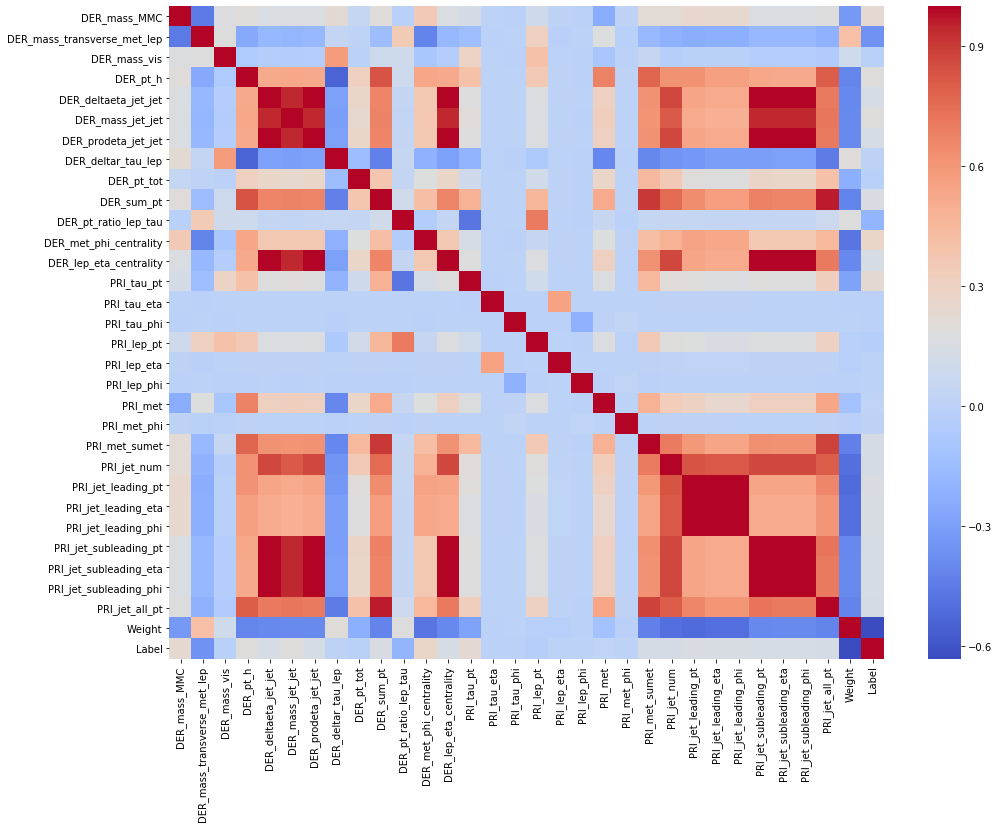

In [42]:
plt.figure(figsize=(16,12))
sns.heatmap(df.drop(['EventId'], axis=1).corr(), cmap='coolwarm')

In [43]:
df.corr()

,EventId,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,...,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label
EventId,1.000000,0.001917,-0.006059,-0.001851,0.002073,-0.000060,0.000353,-0.000075,-0.001349,-0.000581,...,0.000175,0.001396,0.001216,0.001214,-0.000065,-0.000068,-0.000060,0.001024,-0.002838,0.002248
DER_mass_MMC,0.001917,1.000000,-0.455755,0.168548,0.198765,0.162661,0.160524,0.162521,0.228105,0.045826,...,0.221078,0.250158,0.247083,0.247078,0.162836,0.162614,0.162609,0.185372,-0.327244,0.239149
DER_mass_transverse_met_lep,-0.006059,-0.455755,1.000000,0.190109,-0.249116,-0.176386,-0.190392,-0.175942,0.043251,0.017758,...,-0.210537,-0.229674,-0.220370,-0.220355,-0.176837,-0.176231,-0.176225,-0.210009,0.419843,-0.351428
DER_mass_vis,-0.001851,0.168548,0.190109,1.000000,-0.062562,-0.032251,-0.040620,-0.032126,0.579712,-0.000702,...,-0.026860,-0.019151,-0.013749,-0.013742,-0.033188,-0.032202,-0.032206,-0.052902,0.102172,-0.014055
DER_pt_h,0.002073,0.198765,-0.249116,-0.062562,1.000000,0.523664,0.534531,0.523639,-0.539379,0.310501,...,0.623401,0.621599,0.564898,0.564894,0.531647,0.523714,0.523703,0.808616,-0.414084,0.192526
DER_deltaeta_jet_jet,-0.000060,0.162661,-0.176386,-0.032251,0.523664,1.000000,0.946045,0.999981,-0.299076,0.270878,...,0.867521,0.545027,0.521657,0.521664,0.999346,0.999995,0.999996,0.712446,-0.395375,0.141646
DER_mass_jet_jet,0.000353,0.160524,-0.190392,-0.040620,0.534531,0.946045,1.000000,0.944443,-0.303751,0.247771,...,0.814191,0.521645,0.493233,0.493241,0.947652,0.945505,0.945507,0.719962,-0.394004,0.191766
DER_prodeta_jet_jet,-0.000075,0.162521,-0.175942,-0.032126,0.523639,0.999981,0.944443,1.000000,-0.299083,0.271435,...,0.867741,0.545022,0.521653,0.521661,0.999347,0.999988,0.999989,0.712620,-0.395004,0.140554
DER_deltar_tau_lep,-0.001349,0.228105,0.043251,0.579712,-0.539379,-0.299076,-0.303751,-0.299083,1.000000,-0.148081,...,-0.347904,-0.335851,-0.304161,-0.304145,-0.303416,-0.299107,-0.299101,-0.448737,0.197881,0.012245
DER_pt_tot,-0.000581,0.045826,0.017758,-0.000702,0.310501,0.270878,0.247771,0.271435,-0.148081,1.000000,...,0.360409,0.202920,0.186564,0.186590,0.279203,0.271100,0.271091,0.403382,-0.219507,-0.015287


In [44]:
from sklearn.preprocessing import RobustScaler

In [45]:
scaler = RobustScaler()

In [46]:
scaler.fit(df.drop(['EventId', 'Weight', 'Label'], axis=1))

RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
             with_scaling=True)

In [47]:
scaled_data = scaler.transform(df.drop(['EventId', 'Weight', 'Label'], axis=1))

In [48]:
scaled_df = pd.DataFrame(scaled_data, columns=df.drop(['EventId', 'Weight', 'Label'], axis=1).columns)

In [49]:
from sklearn.decomposition import PCA

In [50]:
pca = PCA(n_components=2)

In [51]:
pca.fit(scaled_data)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [52]:
pca_data = pca.transform(scaled_data)

In [53]:
pca.explained_variance_ratio_

array([0.79941427, 0.07158938])

In [54]:
for i in range(0, 8):
    pca = PCA(n_components=i)
    pca.fit(scaled_data)
    pca_data = pca.transform(scaled_data)

In [55]:
pca.explained_variance_ratio_

array([0.79941427, 0.07158938, 0.02945643, 0.02295639, 0.01351438,
       0.00996207, 0.00880798])

In [56]:
var_sum = []
total = 0
for i in range(0, len(pca.explained_variance_ratio_)):
    total += pca.explained_variance_ratio_[i]
    var_sum.append(total)
    
var_sum

[0.7994142682423131,
 0.8710036465167221,
 0.9004600789164834,
 0.9234164705934399,
 0.9369308505869826,
 0.9468929245963197,
 0.9557009032460759]

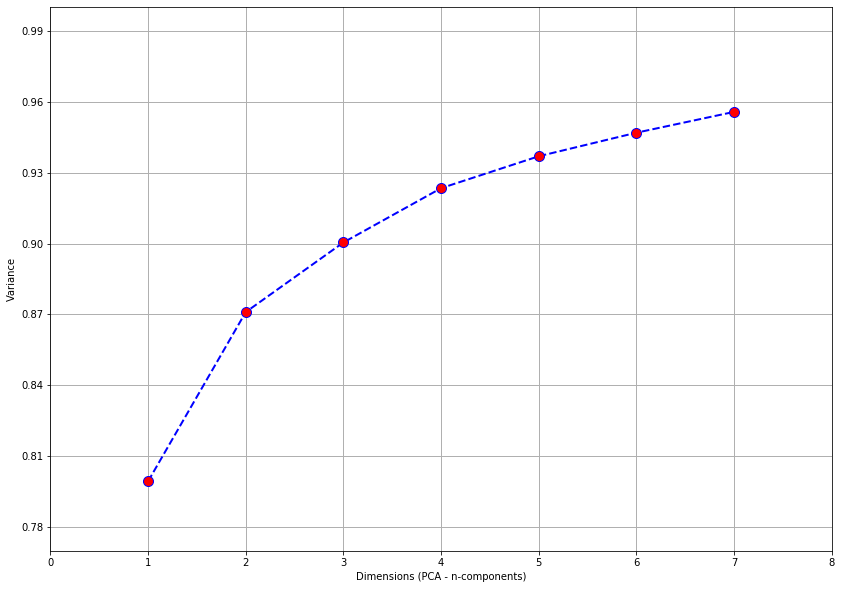

In [57]:
plt.figure(figsize=(14,10))
plt.grid(linestyle='-', linewidth=1)
plt.xticks(range(0,20))
plt.yticks(np.arange(0, 1, step=0.03))
plt.xlabel('Dimensions (PCA - n-components)')
plt.ylabel('Variance')
plt.xlim(0.0, 8)
plt.ylim(0.77,1)
plt.plot(range(1,8), var_sum, color='blue', marker='o', linestyle='dashed', 
         linewidth=2, markersize=10, markerfacecolor='red')

In [58]:
pca.components_.shape

(7, 30)

In [59]:
df.drop(['EventId', 'Weight', 'Label'], axis=1).columns

Index(['DER_mass_MMC', 'DER_mass_transverse_met_lep', 'DER_mass_vis',
       'DER_pt_h', 'DER_deltaeta_jet_jet', 'DER_mass_jet_jet',
       'DER_prodeta_jet_jet', 'DER_deltar_tau_lep', 'DER_pt_tot', 'DER_sum_pt',
       'DER_pt_ratio_lep_tau', 'DER_met_phi_centrality',
       'DER_lep_eta_centrality', 'PRI_tau_pt', 'PRI_tau_eta', 'PRI_tau_phi',
       'PRI_lep_pt', 'PRI_lep_eta', 'PRI_lep_phi', 'PRI_met', 'PRI_met_phi',
       'PRI_met_sumet', 'PRI_jet_num', 'PRI_jet_leading_pt',
       'PRI_jet_leading_eta', 'PRI_jet_leading_phi', 'PRI_jet_subleading_pt',
       'PRI_jet_subleading_eta', 'PRI_jet_subleading_phi', 'PRI_jet_all_pt'],
      dtype='object')

In [60]:
df_comp = pd.DataFrame(pca.components_, columns=df.drop(['EventId', 'Weight', 'Label'], axis=1).columns)

In [61]:
df_comp

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,...,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt
0,0.995349,-0.038413,0.027727,0.026647,0.010302,0.013589,0.010314,0.019463,0.006051,0.026359,...,0.000564,0.027486,0.014824,0.016759,0.016302,0.016300,0.010548,0.010305,0.010303,0.023016
1,-0.054560,-0.018467,-0.014592,0.365796,0.145052,0.192638,0.145342,-0.163384,0.167182,0.377842,...,0.001444,0.340174,0.168647,0.142420,0.129454,0.129445,0.150277,0.145148,0.145121,0.352807
2,-0.017486,0.204189,0.688189,-0.032016,-0.036906,-0.051953,-0.036880,0.198528,-0.001672,0.061692,...,-0.001873,0.018460,-0.039027,-0.034266,-0.034288,-0.034284,-0.037454,-0.036887,-0.036881,-0.043294
3,-0.023935,-0.080422,0.399547,-0.011000,-0.030274,-0.032693,-0.030394,0.076708,-0.029584,0.038241,...,0.000258,0.048186,-0.036338,-0.028207,-0.029022,-0.029015,-0.030834,-0.030313,-0.030310,-0.034375
4,0.040622,0.067509,-0.244816,0.295481,-0.250106,-0.305082,-0.250444,-0.197506,0.004540,0.018443,...,-0.000261,0.032830,-0.204747,-0.086430,-0.101233,-0.101224,-0.251974,-0.250173,-0.250134,-0.047927
5,0.016219,0.093117,0.185328,-0.067363,-0.021505,-0.040592,-0.021262,0.226534,0.780652,-0.072876,...,-0.002002,0.050757,-0.003537,-0.070937,-0.069324,-0.069312,-0.019187,-0.021408,-0.021412,0.022608
6,0.000684,0.006230,-0.013184,-0.020548,0.007365,0.009417,0.007388,-0.003358,0.066665,0.006044,...,-0.001856,0.012275,-0.002715,-0.023810,-0.024539,-0.024210,0.007891,0.007248,0.007369,0.003819


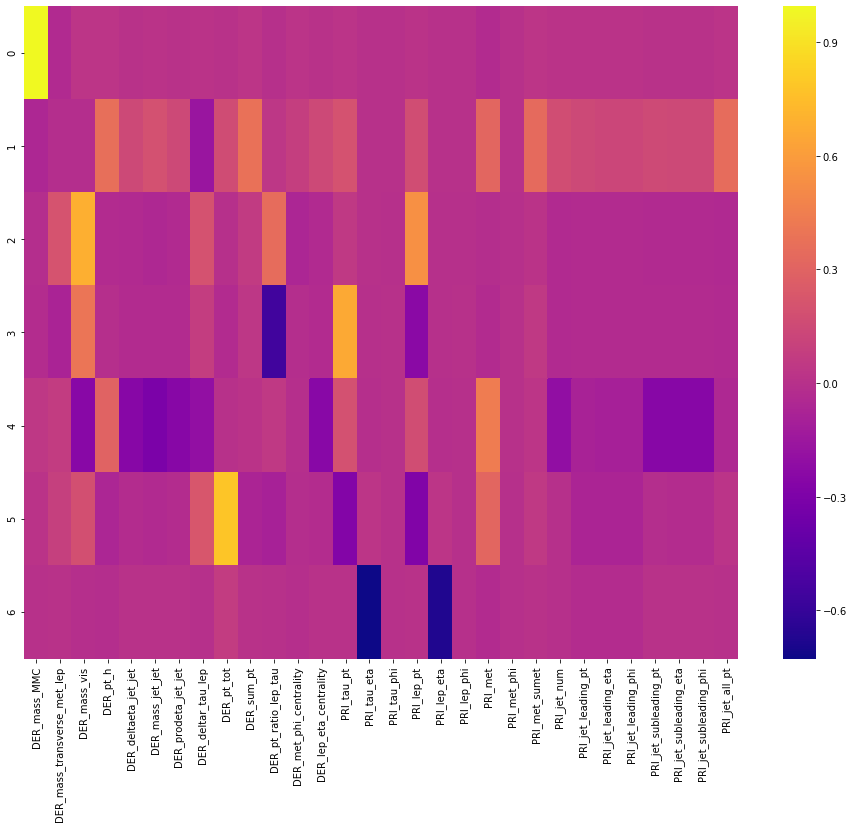

In [62]:
plt.figure(figsize=(16,12))
sns.heatmap(df_comp, cmap='plasma')

In [63]:
from sklearn.model_selection import train_test_split

In [64]:
scaled_df = pd.DataFrame(data = scaled_data, columns=df.drop(['EventId', 'Weight', 'Label'], axis=1).columns)

In [65]:
scaled_df = pd.concat([scaled_df, df['Weight']], axis=1)

In [66]:
scaled_df = pd.concat([scaled_df, df['Label']], axis=1)

In [67]:
X = scaled_df.drop('Label', axis=1)
y = scaled_df['Label']

In [68]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.4, random_state = 123)

In [69]:
from sklearn.linear_model import LogisticRegression

In [70]:
log_model = LogisticRegression()

In [71]:
log_model.fit(X_train, y_train)

/home/dhruvil/projects/data-science/dsenv/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [72]:
predictions = log_model.predict(X_test)

In [73]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [74]:
confusion_matrix(y_test, predictions)

array([[65622,   127],
       [    4, 34247]])

In [75]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     65749
           1       1.00      1.00      1.00     34251

    accuracy                           1.00    100000
   macro avg       1.00      1.00      1.00    100000
weighted avg       1.00      1.00      1.00    100000



In [76]:
ndf = df.copy()

In [77]:
ndf = ndf[['DER_mass_MMC', 'DER_mass_transverse_met_lep', 'DER_mass_vis',
       'DER_deltar_tau_lep', 'DER_pt_tot', 'DER_pt_ratio_lep_tau',
       'DER_met_phi_centrality', 'PRI_tau_pt', 'PRI_tau_eta', 'PRI_tau_phi',
       'PRI_lep_pt', 'PRI_lep_eta', 'PRI_lep_phi', 'PRI_met', 'PRI_met_phi', 'Weight', 'Label']]

In [78]:
scaler.fit(ndf.drop(['Weight', 'Label'], axis=1))

RobustScaler(copy=True, quantile_range=(25.0, 75.0), with_centering=True,
             with_scaling=True)

In [79]:
sc_data = scaler.transform(ndf.drop(['Weight', 'Label'], axis=1))

In [80]:
sc_df = pd.DataFrame(sc_data, columns=['DER_mass_MMC', 'DER_mass_transverse_met_lep', 'DER_mass_vis',
       'DER_deltar_tau_lep', 'DER_pt_tot', 'DER_pt_ratio_lep_tau',
       'DER_met_phi_centrality', 'PRI_tau_pt', 'PRI_tau_eta', 'PRI_tau_phi',
       'PRI_lep_pt', 'PRI_lep_eta', 'PRI_lep_phi', 'PRI_met', 'PRI_met_phi'])

In [81]:
sc_df = pd.concat([sc_df, df[['Weight', 'Label']]], axis=1)

In [82]:
pca1 = PCA(n_components=2)

In [83]:
pca1.fit(df.drop(['Weight', 'Label'], axis=1))

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [84]:
pc_data = pca1.transform(df.drop(['Weight', 'Label'], axis=1))

In [85]:
pca1.explained_variance_ratio_

array([9.99487918e-01, 3.80658008e-04])

In [86]:
pca_df = pd.DataFrame()
pca_df['pca_1'] = pc_data[:,0]
pca_df['pca_2'] = pc_data[:,1]
pca_df['label'] = df['Label']

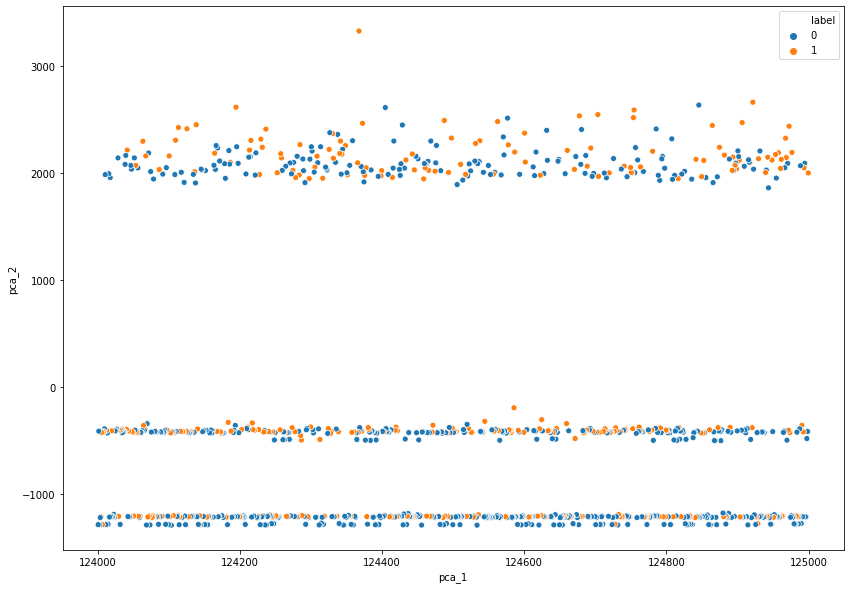

In [87]:
plt.figure(figsize=(14,10))
sns.scatterplot(x='pca_1', y='pca_2',data=pca_df.iloc[:1000, :], hue='label')

In [88]:
plt.figure(figsize=(14,10))


<Figure size 1008x720 with 0 Axes>

<Figure size 1008x720 with 0 Axes>

In [89]:
import plotly.express as px

In [90]:
tsne_df = pd.read_csv('tsne_df.csv')

In [91]:
tsne_df.head()

,Unnamed: 0,tsne_1,tsne_2,tsne_3,label
0,0,-1.717479,-1.931761,-1.048212,1
1,1,-0.674409,2.540889,-0.594487,0
2,2,2.555641,2.082207,0.061039,0
3,3,1.405450,-0.337249,1.396000,0
4,4,1.069244,-2.461386,1.041671,0


In [92]:
tsne_df.drop('Unnamed: 0', inplace=True, axis=1)

In [97]:
fig = px.scatter_3d(tsne_df, x='tsne_1', y='tsne_2', z='tsne_3', color='label')

In [98]:
fig.show()

In [101]:
import plotly

In [102]:
plotly.offline.plot(fig, filename = 'filename.html', auto_open=False)

'filename.html'

In [105]:
X = ndf.drop('Label', axis=1)
y = ndf['Label']

In [106]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 123)

from sklearn.linear_model import LogisticRegression

log_model_1 = LogisticRegression()

log_model_1.fit(X_train, y_train)

predictions = log_model_1.predict(X_test)

print(classification_report(y_test, predictions))

/home/dhruvil/projects/data-science/dsenv/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.



              precision    recall  f1-score   support

           0       1.00      1.00      1.00     49310
           1       1.00      1.00      1.00     25690

    accuracy                           1.00     75000
   macro avg       1.00      1.00      1.00     75000
weighted avg       1.00      1.00      1.00     75000



In [107]:
print(confusion_matrix(y_test, predictions))

[[49217    93]
 [    4 25686]]


Random Forest

In [108]:
from sklearn.ensemble import RandomForestClassifier

In [109]:
rfc = RandomForestClassifier(n_estimators=300)

In [111]:
rfc.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=300,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [112]:
predictions = rfc.predict(X_test)

In [113]:
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

[[49310     0]
 [    0 25690]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     49310
           1       1.00      1.00      1.00     25690

    accuracy                           1.00     75000
   macro avg       1.00      1.00      1.00     75000
weighted avg       1.00      1.00      1.00     75000



In [114]:
from sklearn.ensemble import RandomForestRegressor

In [115]:
rfr = RandomForestRegressor(n_estimators=300)

In [116]:
X = ndf.drop(['Weight', 'Label'], axis=1)
y = ndf['Weight']

In [117]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 123)

In [118]:
rfr.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=300,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [119]:
predictions = rfr.predict(X_test)

In [120]:
import math
from sklearn.metrics import mean_squared_error

In [121]:
math.sqrt(mean_squared_error(y_test, predictions))

1.215590774369989

In [122]:
df[df.duplicated(keep=False)]

,EventId,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,...,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label


SVM

In [128]:
new_df = ndf.copy()

In [129]:
new_df['Label'] = new_df.apply(lambda x: str(x[-1]), axis=1)

In [130]:
x = new_df['Label'].str.replace('0', 'b', regex=False)
x = x.str.replace('1', 's', regex=False)

new_df['Label'] = x

In [123]:
from sklearn.svm import SVC

In [124]:
svc = SVC()

In [132]:
X = ndf.drop('Label', axis=1)
y = ndf['Label']

In [133]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 123)

In [ ]:
svc.fit(X_train, y_train)

/home/dhruvil/projects/data-science/dsenv/lib/python3.6/site-packages/sklearn/svm/base.py:193: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.



In [ ]:
predictions = svc.predict(X_test)

In [ ]:
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

In [ ]:
X1 = df.drop(['EventId', 'Label'], axis=1)
y1 = df['Label']
Xt,xt, Yt, yt = train_test_split(X1, y1, test_size=0.4)